In [1]:
import aux_function
import corretores_lib
import prepara_dados
import aux_function_treino
import config

In [2]:
import pandas as pd
import os
import numpy as np
os.chdir(config.main_path)
pd.options.display.max_columns = None
pd.options.display.max_rows = 250
import seaborn as sns
import math

from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler, StandardScaler, FunctionTransformer, LabelEncoder
from sklearn.decomposition import PCA
import sklearn.metrics as metrics
import warnings
warnings.filterwarnings("ignore")

import boto3 as b3
import io
from io import StringIO
import unidecode

<h3> Extrair os dados do bucket S3 </h3>

In [3]:
#df_leads = aux_function.load_base_treino_s3('LEADS/STG_BASE_VENDAS_UNIFICADA_20201013.csv','iso8859_2', '|')
df_leads = aux_function.load_base_treino_s3('D1_BASE/LEADS/STG_BASE_VENDAS_UNIFICADA.csv','utf_8_sig', '|')

<h3> Filtra dados desde 2017 </h3>

In [4]:
df = df_leads[df_leads.data_referencia_relatorio.between('2017-01-01', '2021-12-30')]
del df_leads

In [5]:
#trata espaços em branco
df = aux_function.limpeza_whitespace(df)

print(f'A base bruta contém {len(df)} leads distintos desde 2017')

A base bruta contém 1750210 leads distintos desde 2017


In [6]:
df['FLGVENDASAUDE'] = df.FLGVENDASAUDE.replace({False: 'N', 'false':'N', 'False':'N', True:'Y', 'true':'Y', 'True':'Y'})
df['ID_LEAD']=df['ID_CHAVE'].astype(str)+'/'+df['ID_ETL'].astype(str)
df = df[df.ID_LEAD!='n/n']
df = df[df.FLGVENDASAUDE!='nan']
#somente flags válidas
df = df[df.ID_LEAD!='n/n']
df = df[df.FLGVENDASAUDE!='nan']
df = df[df.FLGVENDASAUDE.isin(['N', 'Y'])]

In [7]:
df = df[df.FLGVENDASAUDE.isin(['Y', 'N'])]
df['FLGVENDASAUDE'] = df['FLGVENDASAUDE'].replace("N",0)
df['FLGVENDASAUDE'] = df['FLGVENDASAUDE'].replace("Y",1)

<h3> Filtros do Marketing </h3>

In [8]:
#filtros da área de markting. São considerados apenas praças com metas. 
#praça
praca = ['AL', 'AM', 'BA', 'CE', 'DF', 'GSP', 'MA', 'MG', 'PA', 'PB', 'PE',
         'PETRÓPOLIS', 'PR', 'RJ', 'RN', 'RS', 'SC', 'SE', 'SOROCABA', 'SPI_Campinas', 'VALE DO PARAÍBA']
#grupo origem
#grupo_origem = ['Captura', 'Filipeta', 'Hotline', 'Solicitaçăo', 'Mobile', 'Detalhe do Plano']
grupo_origem = ['Captura', 'Filipeta', 'Hotline', 'Solicitaçăo', 'Mobile', 'Detalhe do Plano','MAIOR OU IGUAL A 65 ANOS',
                'MAIOR OU IGUAL A 65 ANOS - MARCAÇĂO INCORRETA' , 'Hotline - Bradesco', 'Filipeta - Bradesco']
#flag cliente ativo
flciente_ativo = ['FALSE','VENDA90DIAS','False', 'VENDA']

df['filtro_praca'] = df.PRACA.apply(lambda x: 1 if x in praca else 0)
df['filtro_origem'] = df.GRUPOORIGEM.apply(lambda x: 1 if x in grupo_origem else 0)
df['filtro_cliente_ativo'] = df.FlClienteAtivo.apply(lambda x: 1 if x in flciente_ativo else 0)
df['Filtro'] = df['filtro_origem']&df['filtro_cliente_ativo']
df_f = df[df.Filtro==1]

<h3> Selecionar os corretores </h3>

In [9]:
dict_nomes_corrigir = {'ADRIANO OLIVEIRA':'ADRIANO TIMOTEO DE OLIVEIRA',
'ANA PAULA D ANGELO':'ANA PAULA DANGELO',
'CAMILA TOBIAS\xa0DE\xa0MORAIS CASSIANO':'CAMILA TOBIAS DE MORAIS',
'DANIELE SANTIAGO':'DANIELLE SIMOES SANTIAGO',
'JULIANA COSTABILE':'JULIANA HELEN QUINTEIRO COSTABILE',
'MARIA DE LOURDES SILVA':'MARIA LOURDES SILVA',
'MARIA LUCIANA MOREIRA':'MARIA LUCIANA MOREIRA NUNES DE MOURA',
'PATRICIA PEREIRA':'PATRICIA PEREIRA VILAR LIMA',
'ROBERTO CAMPOS':'ROBERTO CAMPOS ALVES',
'SANDRA COSTA':'SANDRA REGINA AIRES DA COSTA'}

In [10]:
df_f.CORRETOR_DISTRIBUICAO = df_f.CORRETOR_DISTRIBUICAO.str.upper().replace(dict_nomes_corrigir)

In [11]:
corretores_ativos, corr_interno, corretores_disponiveis = corretores_lib.corr_ativos()
corretores = corretores_ativos.rename(columns={'cpf':'CPF_CORRETOR', 'nome':'CORRETOR_DISTRIBUICAO'})

corretores.CORRETOR_DISTRIBUICAO = corretores.CORRETOR_DISTRIBUICAO.astype(str).apply(lambda x: unidecode.unidecode(x.upper())) 
df_f.CORRETOR_DISTRIBUICAO = df_f.CORRETOR_DISTRIBUICAO.astype(str).apply(lambda x: unidecode.unidecode(x.upper())) 
#df = pd.merge(df, corretores_cpf_tratado, how='left', on='CORRETOR_DISTRIBUICAO')
#df = pd.merge(df, base_corretores[['Nome', 'CPF']], how='left', left_on='CORRETOR_DISTRIBUICAO', right_on='Nome')
df_f = pd.merge(df_f, corretores[['CORRETOR_DISTRIBUICAO', 'CPF_CORRETOR']], how='left', on='CORRETOR_DISTRIBUICAO')

É necessário ao modelo ler o histórico de convertidos e não-convertidos do corretor. Para isso, devemos selecionar corretores com ao menos 5 leads convertidos para entregar melhores recomendações

In [12]:
df_corretores = df_f[df_f.FLGVENDASAUDE==1][df_f.data_referencia_relatorio.between('2020-09-01', '2021-07-30')].CORRETOR_DISTRIBUICAO.value_counts().reset_index()
df_corretores = df_f[df_f.CPF_CORRETOR.isin(set(corretores.CPF_CORRETOR))]

In [13]:
df_f

,DATAGERACAOLEAD,data_referencia_relatorio,idLeadSimulador,DSNOME,NM_ORIGEM,GRUPOORIGEM,CANAL_HOMOLOGACAO,ANO_MES_REFERENCIA,TELEFONE1,TELEFONE2,DSEMAIL,CPF,CPF_SIMULADORWEB,FLGVENDASAUDE,VENDASAUDE90DIAS,VENDASAUDE120DIAS,MESVENDASAUDE,FORMABUSCAVENDA,QUANTIDADEVIDASVENDASAUDE,QUANTIDADEDIASVENDASAUDE,PRACA,CANAL_DISTRIBUICAO,ID_CHAVE,ID_ETL,numdbm,QUANTIDADELEADS,MIDIA,TICKET_MEDIO,TEMPO_PERMANENCIA_DIAS,STATUS_PLANO,NOME_CORRETOR_VENDA,ORIGEM_DE_MIDIA_VEICULO,ORIGEM_DE_MIDIA_FORMATO,ORIGEM_DE_MIDIA_CAMPANHA,ENTIDADE,PLANO,numeroProposta,SEXO,CHURN_DIAS,DS_ORIGEM_MIDIA,CIDADE,ESTADO,EntidadeLead,Canal_Venda,FlClienteAtivo,tempoMedioAtendimento,tempoEntrega,dtAtribuicao,DATA_NASCIMENTO,ds_profissao,flcrmzen,Projeto_origem,Oberservacao,DATA_ATRIBUICAO_1ºCONSULTOR,1ºCONSULTOR,1ºSUPERVISOR,2ºCONSULTOR,3ºCONSULTOR,4ºCONSULTOR,CONSULTOR_ATUALIZADO,SUPERVISOR_ATUALIZADO,GERENTE_ATUALIZADO,STATUS_PRIMEIRO_RESULTADO,STATUS_ULTIMO_RESULTADO,DATA_ULTIMO_RESULTADO,data_redistribuicao,Consultor_Redistribuição,Motivo_Redistribuicao,CANAL_DISTRIBUICAO_NOVO,CORRETOR_DISTRIBUICAO,CANAL_CORRETOR_VENDA,ORDEM,CPFcorretor,utm_term,device,Idlead,UTM_SOURCE,UTM_MEDIUM,UTM_CAMPAIGN,UTM_CONTENT,ID_LEAD,filtro_praca,filtro_origem,filtro_cliente_ativo,Filtro,CPF_CORRETOR
0,06/08/2018 16:24:11,2018-08-06,nan,FABIANA MOREIRA LIMA,Hotline,Hotline,Não Entregue,2018-08,nan,61986365721,nan,nan,nan,0,0.0,0.0,nan,nan,nan,nan,DF,nan,488565.0,349944.0,1440316233,1,INDICACAO CLIENTE,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,INDICACAO,BRASILIA,nan,nan,nan,FALSE,n/d,n/d,nan,1992/10/11 00:00:00.000,nan,0.0,INDICAÇÕES,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,Não Distribuído,NAO DISTRIBUIDO,Não Distribuído,1.0,NaN,nan,nan,NaN,nan,nan,nan,nan,488565.0/349944.0,1,1,1,1,NaN
1,07/12/2017 10:36:06,2017-12-07,nan,ROGERIO GEOVANA RIQUELE MIRANDA VIANA,Hotline,Hotline,Não Entregue,2017-12,nan,31994085253,nan,nan,nan,0,0.0,0.0,nan,nan,nan,nan,MG,nan,432072.0,263978.0,1317115089,1,SMS,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,MARKETING DIRETO,BELO HORIZONTE,nan,nan,nan,FALSE,n/d,n/d,nan,2010/12/09 00:00:00.000,nan,0.0,INDICAÇÕES,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,Não Distribuído,NAO DISTRIBUIDO,Não Distribuído,1.0,NaN,nan,nan,NaN,nan,nan,nan,nan,432072.0/263978.0,1,1,1,1,NaN
2,11/12/2017 14:45:24,2017-12-11,nan,VIVIAM GOMES CAMARGO,Hotline,Hotline,Não Entregue,2017-12,nan,98991971212,nan,nan,nan,0,0.0,0.0,nan,nan,nan,nan,MA,nan,432564.0,272141.0,1474009952,1,INDICACAO ENTIDADE,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,INDICACAO,TELE VENDAS,nan,nan,nan,FALSE,n/d,n/d,nan,1975/12/14 00:00:00.000,nan,0.0,INDICAÇÕES,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,Não Distribuído,NAO DISTRIBUIDO,Não Distribuído,1.0,NaN,nan,nan,NaN,nan,nan,nan,nan,432564.0/272141.0,1,1,1,1,NaN
3,12/12/2017 13:11:26,2017-12-12,nan,ANA CARLA DOS ANJOS OLIVEIRA,Hotline,Hotline,Não Entregue,2017-12,nan,11968316801,nan,nan,nan,0,0.0,0.0,nan,nan,nan,nan,GSP,nan,432847.0,272474.0,1335845463,1,INDICACAO ENTIDADE,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,INDICACAO,TELE VENDAS,nan,nan,nan,FALSE,n/d,n/d,nan,1982/11/10 00:00:00.000,nan,0.0,INDICAÇÕES,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,Não Distribuído,NAO DISTRIBUIDO,Não Distribuído,1.0,NaN,nan,nan,NaN,nan,nan,nan,nan,432847.0/272474.0,1,1,1,1,NaN
4,13/11/2017 16:03:49,2017-11-13,nan,GABRIEL FERREIRA PERREIRA,Hotline,Hotline,Não Entregue,2017-11,nan,34996975164,nan,nan,nan,0,0.0,0.0,nan,nan,nan,nan,MG,nan,427503.0,257207.0,1302400504,1,INTERNET GOOGLE,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,NaN,nan,nan,MIDIA ONLINE,BELO HORIZONTE,nan,nan,nan,FALSE,n/d,n/d,nan,1997/08/22 00:00:00.000,nan,0.0,INDICAÇÕES,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,Não Distribuído,NAO DISTRIBUIDO,Não Distribuído,1.0,NaN,nan,nan,NaN,nan,nan,n

In [14]:
df_corretores.CORRETOR_DISTRIBUICAO.value_counts()

WAGNER LEONARDI ROSSI                     17148
RENATA GOMES CAMPELONGO CORREA            16929
LEANDRO RODRIGUES SIQUEIRA                16678
DANIELLA DE CAMARGO PINHO                 16524
ANA KATIA LOPES DA SILVA                  16128
JULIANA HELEN QUINTEIRO COSTABILE         16021
RAPHAEL ZIBINI LAMUCIO                    14411
ANA PAULA SOARES                          13956
TAMIRES ALVES DE OLIVEIRA                 13490
ANAILDES SANTOS FERREIRA                  11904
FABIANA DE MORAIS SILVEIRA                11561
TAINAN DA SILVA                           10486
BRUNA PINA DA SILVA                        9341
JULIANA ANTUNES SACCO                      8785
BRUNO CAVALCANTE MUNIZ                     7612
SARA PANOBIANCO CONSTANTINO                6860
AMANDA CARMAGNANI                          5449
THAIS CRISTINA JORGE                       4722
DAYANE ALESSANDRA DA SILVA                 3787
ALINE SILVA                                3504
PRISCILA MARIA MACHADO DE SOUZA         

In [15]:
df_corretores.columns

Index(['DATAGERACAOLEAD', 'data_referencia_relatorio', 'idLeadSimulador',
       'DSNOME', 'NM_ORIGEM', 'GRUPOORIGEM', 'CANAL_HOMOLOGACAO',
       'ANO_MES_REFERENCIA', 'TELEFONE1', 'TELEFONE2', 'DSEMAIL', 'CPF',
       'CPF_SIMULADORWEB', 'FLGVENDASAUDE', 'VENDASAUDE90DIAS',
       'VENDASAUDE120DIAS', 'MESVENDASAUDE', 'FORMABUSCAVENDA',
       'QUANTIDADEVIDASVENDASAUDE', 'QUANTIDADEDIASVENDASAUDE', 'PRACA',
       'CANAL_DISTRIBUICAO', 'ID_CHAVE', 'ID_ETL', 'numdbm', 'QUANTIDADELEADS',
       'MIDIA', 'TICKET_MEDIO', 'TEMPO_PERMANENCIA_DIAS', 'STATUS_PLANO',
       'NOME_CORRETOR_VENDA', 'ORIGEM_DE_MIDIA_VEICULO',
       'ORIGEM_DE_MIDIA_FORMATO', 'ORIGEM_DE_MIDIA_CAMPANHA', 'ENTIDADE',
       'PLANO', 'numeroProposta', 'SEXO', 'CHURN_DIAS', 'DS_ORIGEM_MIDIA',
       'CIDADE', 'ESTADO', 'EntidadeLead', 'Canal_Venda', 'FlClienteAtivo',
       'tempoMedioAtendimento', 'tempoEntrega', 'dtAtribuicao',
       'DATA_NASCIMENTO', 'ds_profissao', 'flcrmzen', 'Projeto_origem',
       'Oberse

In [16]:
df_f['data_referencia_relatorio'] = pd.to_datetime(df_f['data_referencia_relatorio'])
df_f['dia_da_semana'] = df_f.data_referencia_relatorio.dt.weekday

df_f = df_f.sort_values('data_referencia_relatorio')

In [17]:
df_distribuição = df_f[['CANAL_DISTRIBUICAO_NOVO', 'CORRETOR_DISTRIBUICAO']]
df_distribuição = df_distribuição.groupby('CORRETOR_DISTRIBUICAO').first().reset_index()

In [18]:
df_distribuição

,CORRETOR_DISTRIBUICAO,CANAL_DISTRIBUICAO_NOVO
0,ADEMIR DE SOUZA DO AMPARO,EXTERNO
1,ADRIANA ALVES DOS SANTOS,INTERNO
2,ADRIANA DA COSTA DAMASCENO ALVES,TELEVENDAS
3,ADRIANA DE SOUZA OLIVEIRA,INTERNO
4,ADRIANA GOMES SANTANA,EXTERNO
...,...,...
1090,WILSON DANIEL DOS SANTOS MEDEIROS,EXTERNO
1091,WISNER RONEY DA SILVA RODRIGUES,INTERNO
1092,WISNER RONEY SILVA RODRIGUES,INTERNO
1093,YASMIM DA SILVA BARRETO,EXTERNO


In [19]:
df_corretores = pd.merge(df_corretores, df_distribuição, left_on='CORRETOR_DISTRIBUICAO', right_on='CORRETOR_DISTRIBUICAO', how='left')
df_corretores

,DATAGERACAOLEAD,data_referencia_relatorio,idLeadSimulador,DSNOME,NM_ORIGEM,GRUPOORIGEM,CANAL_HOMOLOGACAO,ANO_MES_REFERENCIA,TELEFONE1,TELEFONE2,DSEMAIL,CPF,CPF_SIMULADORWEB,FLGVENDASAUDE,VENDASAUDE90DIAS,VENDASAUDE120DIAS,MESVENDASAUDE,FORMABUSCAVENDA,QUANTIDADEVIDASVENDASAUDE,QUANTIDADEDIASVENDASAUDE,PRACA,CANAL_DISTRIBUICAO,ID_CHAVE,ID_ETL,numdbm,QUANTIDADELEADS,MIDIA,TICKET_MEDIO,TEMPO_PERMANENCIA_DIAS,STATUS_PLANO,NOME_CORRETOR_VENDA,ORIGEM_DE_MIDIA_VEICULO,ORIGEM_DE_MIDIA_FORMATO,ORIGEM_DE_MIDIA_CAMPANHA,ENTIDADE,PLANO,numeroProposta,SEXO,CHURN_DIAS,DS_ORIGEM_MIDIA,CIDADE,ESTADO,EntidadeLead,Canal_Venda,FlClienteAtivo,tempoMedioAtendimento,tempoEntrega,dtAtribuicao,DATA_NASCIMENTO,ds_profissao,flcrmzen,Projeto_origem,Oberservacao,DATA_ATRIBUICAO_1ºCONSULTOR,1ºCONSULTOR,1ºSUPERVISOR,2ºCONSULTOR,3ºCONSULTOR,4ºCONSULTOR,CONSULTOR_ATUALIZADO,SUPERVISOR_ATUALIZADO,GERENTE_ATUALIZADO,STATUS_PRIMEIRO_RESULTADO,STATUS_ULTIMO_RESULTADO,DATA_ULTIMO_RESULTADO,data_redistribuicao,Consultor_Redistribuição,Motivo_Redistribuicao,CANAL_DISTRIBUICAO_NOVO_x,CORRETOR_DISTRIBUICAO,CANAL_CORRETOR_VENDA,ORDEM,CPFcorretor,utm_term,device,Idlead,UTM_SOURCE,UTM_MEDIUM,UTM_CAMPAIGN,UTM_CONTENT,ID_LEAD,filtro_praca,filtro_origem,filtro_cliente_ativo,Filtro,CPF_CORRETOR,CANAL_DISTRIBUICAO_NOVO_y
0,09/08/2019 10:11:10,2019-08-09,4140830,RENATA CRISTINA ROCHA SILVA,Sim Mobile,Mobile,Isabela Tavares Zanelato,2019-08,11930300032,nan,renatarocha2017@outlook.com,31966190875,31966190875,0,0.0,0.0,nan,nan,nan,nan,GSP,INTERNO,105190174.0,467408.0,nan,1,nan,NaN,NaN,nan,nan,APCD-SP,texto-texto,entidades,nan,nan,NaN,nan,nan,nan,SÃO PAULO,SP,APCD,nan,FALSE,n/d,00:23,09/08/2019 10:33:12,1984/04/28 00:00:00.000,Cirurgião-Dentista,1.0,SIMULADOR_WEB,nan,2019/08/09 00:00:00.000,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,INTERNO,WAGNER LEONARDI ROSSI,PROPRIO,1.0,3.190380e+10,nan,nan,4497602.0,APCD-SP,texto-texto,entidades,nan,105190174.0/467408.0,1,1,1,1,3.190380e+10,INTERNO
1,09/08/2019 10:25:10,2019-08-09,4140855,DANIELLE FREITAS DA SILVA,Sim Detalhe do Plano,Detalhe do Plano,Márcio Velloso de Lima,2019-08,11960950493,nan,dajududa@gmail.com,32854793889,32854793889,0,0.0,0.0,nan,nan,nan,nan,GSP,INTERNO,105190197.0,467410.0,nan,1,nan,NaN,NaN,nan,nan,google,search_desktop,saopaulo_planosdesaude_search_search_desktop_a...,nan,nan,NaN,nan,nan,nan,SÃO PAULO,SP,FECOMÉRCIO-SP,nan,FALSE,n/d,00:19,09/08/2019 10:43:12,1985/07/28 00:00:00.000,Empregador do Comércio e Serviços,1.0,SIMULADOR_WEB,nan,2019/08/09 00:00:00.000,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,INTERNO,RENATA GOMES CAMPELONGO CORREA,PROPRIO,1.0,2.633356e+10,nan,nan,4497609.0,google,search_desktop,saopaulo_planosdesaude_search_search_desktop_a...,nan,105190197.0/467410.0,1,1,1,1,2.633356e+10,INTERNO
2,09/08/2019 10:32:48,2019-08-09,4140863,OSMAR JONH LIBERTO,Sim Mobile,Mobile,Márcio Velloso de Lima,2019-08,19981204604,nan,osmarjonh2304@gmail.com,39294311813,39294311813,0,0.0,0.0,nan,nan,nan,nan,SPI_Campinas,INTERNO,105190206.0,467411.0,nan,1,nan,NaN,NaN,nan,nan,google,search_desktop,saopaulo_planosdesaude_search_search_desktop_a...,nan,nan,NaN,nan,nan,nan,COSMÓPOLIS,SP,SAESP,nan,FALSE,n/d,00:21,09/08/2019 10:53:10,1991/10/10 00:00:00.000,Administrador,1.0,SIMULADOR_WEB,nan,2019/08/09 00:00:00.000,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,CRM ZEN,Não Trabalhado,Não Trabalhado,nan,nan,nan,nan,INTERNO,DANIELLA DE CAMARGO PINHO,PROPRIO,1.0,2.948535e+10,nan,nan,4497613.0,google,search_desktop,saopaulo_planosdesaude_search_search_desktop_a...,nan,105190206.0/467411.0,1,1,1,1,2.948535e+10,INTERNO
3,09/08/2019 10:42:17,2019-08-09,4140884,CILENE GARCIA,Sim Detalhe do Plano,Detalhe do Plano,Márcio Velloso de Lima,2019-08,11952355521,nan,cilene.izabel@bol.com.br,7061830450,7061830450,0,0.0,0.0,nan,nan,nan,nan,GSP,INTERNO,105190227.0,467413.0,nan,1,nan,NaN,NaN,nan,nan,qualico

In [20]:
df_corretores.CORRETOR_DISTRIBUICAO.value_counts()

WAGNER LEONARDI ROSSI                     17148
RENATA GOMES CAMPELONGO CORREA            16929
LEANDRO RODRIGUES SIQUEIRA                16678
DANIELLA DE CAMARGO PINHO                 16524
ANA KATIA LOPES DA SILVA                  16128
JULIANA HELEN QUINTEIRO COSTABILE         16021
RAPHAEL ZIBINI LAMUCIO                    14411
ANA PAULA SOARES                          13956
TAMIRES ALVES DE OLIVEIRA                 13490
ANAILDES SANTOS FERREIRA                  11904
FABIANA DE MORAIS SILVEIRA                11561
TAINAN DA SILVA                           10486
BRUNA PINA DA SILVA                        9341
JULIANA ANTUNES SACCO                      8785
BRUNO CAVALCANTE MUNIZ                     7612
SARA PANOBIANCO CONSTANTINO                6860
AMANDA CARMAGNANI                          5449
THAIS CRISTINA JORGE                       4722
DAYANE ALESSANDRA DA SILVA                 3787
ALINE SILVA                                3504
PRISCILA MARIA MACHADO DE SOUZA         

In [21]:
df_f

,DATAGERACAOLEAD,data_referencia_relatorio,idLeadSimulador,DSNOME,NM_ORIGEM,GRUPOORIGEM,CANAL_HOMOLOGACAO,ANO_MES_REFERENCIA,TELEFONE1,TELEFONE2,DSEMAIL,CPF,CPF_SIMULADORWEB,FLGVENDASAUDE,VENDASAUDE90DIAS,VENDASAUDE120DIAS,MESVENDASAUDE,FORMABUSCAVENDA,QUANTIDADEVIDASVENDASAUDE,QUANTIDADEDIASVENDASAUDE,PRACA,CANAL_DISTRIBUICAO,ID_CHAVE,ID_ETL,numdbm,QUANTIDADELEADS,MIDIA,TICKET_MEDIO,TEMPO_PERMANENCIA_DIAS,STATUS_PLANO,NOME_CORRETOR_VENDA,ORIGEM_DE_MIDIA_VEICULO,ORIGEM_DE_MIDIA_FORMATO,ORIGEM_DE_MIDIA_CAMPANHA,ENTIDADE,PLANO,numeroProposta,SEXO,CHURN_DIAS,DS_ORIGEM_MIDIA,CIDADE,ESTADO,EntidadeLead,Canal_Venda,FlClienteAtivo,tempoMedioAtendimento,tempoEntrega,dtAtribuicao,DATA_NASCIMENTO,ds_profissao,flcrmzen,Projeto_origem,Oberservacao,DATA_ATRIBUICAO_1ºCONSULTOR,1ºCONSULTOR,1ºSUPERVISOR,2ºCONSULTOR,3ºCONSULTOR,4ºCONSULTOR,CONSULTOR_ATUALIZADO,SUPERVISOR_ATUALIZADO,GERENTE_ATUALIZADO,STATUS_PRIMEIRO_RESULTADO,STATUS_ULTIMO_RESULTADO,DATA_ULTIMO_RESULTADO,data_redistribuicao,Consultor_Redistribuição,Motivo_Redistribuicao,CANAL_DISTRIBUICAO_NOVO,CORRETOR_DISTRIBUICAO,CANAL_CORRETOR_VENDA,ORDEM,CPFcorretor,utm_term,device,Idlead,UTM_SOURCE,UTM_MEDIUM,UTM_CAMPAIGN,UTM_CONTENT,ID_LEAD,filtro_praca,filtro_origem,filtro_cliente_ativo,Filtro,CPF_CORRETOR,dia_da_semana
761649,02/01/2017 09:00:00,2017-01-01,2384289,MURICY FLORENTINO,Sim Captura,Captura,Vplan (interior),2017-01,1141427197,nan,muricy11@live.com,nan,nan,0,0.0,0.0,nan,nan,nan,nan,GSP,EXTERNO,103464140.0,158442.0,1140884217,1,nan,NaN,NaN,nan,nan,google,gdn_desktop,saopaulo_remkt_gdn_gdn_desktop_alwayson-saopau...,nan,nan,NaN,nan,nan,nan,ITAPEVI,SP,Não definida,nan,FALSE,23:38:00,-9:00,02/01/2017 09:00:00,1975/09/23 00:00:00.000,Não definida,0.0,SIMULADOR_WEB,enviado email e,2017/01/02 00:00:00.000,Paulo Santos,Paulo Santos,Elde Miers,Elisabeth Alves Guimares,Paulo Santos,Ana Lucia Zaros,Paulo Santos,Jonata Fernandes de Abreu,Em Atendimento,Em Atendimento,2017/03/07 13:27:49.697000000,nan,nan,nan,EXTERNO,ANA LUCIA ZAROS,TERCEIRO,1.0,NaN,nan,nan,3078400.0,google,gdn_desktop,saopaulo_remkt_gdn_gdn_desktop_alwayson-saopau...,nan,103464140.0/158442.0,1,1,1,1,NaN,6
29660,02/01/2017 09:00:00,2017-01-01,2384630,FRANCIELEN ALVES,Sim Detalhe do Plano,Detalhe do Plano,Isabela Tavares Zanelato,2017-01,17991589738,nan,francielen.ieqnh@outlook.com,nan,nan,0,0.0,0.0,nan,nan,nan,nan,SPI,INTERNO,103464481.0,158712.0,1140889725,1,nan,NaN,NaN,nan,nan,ShopBack,ShopTarget_retarget,email_3dias,nan,nan,NaN,nan,nan,nan,NOVO HORIZONTE,SP,Não definida,nan,FALSE,35:15:00,00:00,02/01/2017 09:00:00,1996/09/11 00:00:00.000,Não definida,0.0,SIMULADOR_WEB,nan,2017/01/02 00:00:00.000,Maria de Lourdes Pimenta Salomão,Sérgio de Andrade,nan,nan,nan,Renata Gomes Campelongo Correa,Márcio Velloso de Lima,Rafael Andrade Bueno Maganete,Em Atendimento,Em Atendimento,2017/03/09 09:00:00.000000000,nan,nan,nan,Não Distribuído,NAO DISTRIBUIDO,Não Distribuído,1.0,NaN,nan,nan,3078656.0,ShopBack,ShopTarget_retarget,email_3dias,nan,103464481.0/158712.0,0,1,1,1,NaN,6
29661,02/01/2017 09:00:00,2017-01-01,2384631,CARLA NEVES,Sim Mobile,Mobile,Márcio Velloso de Lima,2017-01,11962345486,nan,carla.neves.molena@hotmail.com,nan,nan,0,0.0,0.0,nan,nan,nan,nan,GSP,INTERNO,103464482.0,158713.0,1140888018,1,nan,NaN,NaN,nan,nan,ShopBack,emailmkt,emailmkt_br,nan,nan,NaN,nan,nan,nan,FRANCO DA ROCHA,SP,SAESP,nan,FALSE,09:00:00,-9:00,02/01/2017 09:00:00,1993/06/02 00:00:00.000,Administrador,0.0,SIMULADOR_WEB,OK,2017/01/02 00:00:00.000,Rafael Andrade Bueno Maganete,Márcio Velloso de Lima,Rodrigo Nantes,Rafael Andrade Bueno Maganete,Ana Cláudia da Silva Gouveia,Ana Cláudia da Silva Gouveia,Márcio Velloso de Lima,Rafael Andrade Bueno Maganete,Em Atendimento,Em Atendimento,2017/03/03 10:35:31.783000000,nan,nan,nan,INTERNO,ANA CLAUDIA DA SILVA GOUVEIA,PROPRIO,1.0,1.850344e+10,nan,nan,3078657.0,ShopBack,emailmkt,emailmkt_br,nan,103464482.0/158713.0,1,1,1,1,1.850344e+10,6
761740,02/01/2017 09:00:00,2017-01-01,2384431,ANA CLAUDIA DANTAS CAROLINO,Sim

Atribui a coluna que numera as semanas da base

In [189]:
i=0
semana = np.zeros(len(df_f))
#coluna -1 é o dia da semana. Retorna uma nova semana se o dia anterior for 4 (sexta) e o atual (segunda)
for i in range(len(df_f)):
    if df_f.iloc[i-1,-1] == 4 and df_f.iloc[i,-1]!=4:
        semana[i] = semana[i-1]+1
    else:
        semana[i] = semana[i-1]

df_f['semana'] = semana

In [190]:
lista_corretores = list(df_corretores.CORRETOR_DISTRIBUICAO.unique())
#lista_corretores_tirar = ['NĂO DISTRIBUIDO', 'CONSULTOR WOOZA', 'ISABELA TAVARES ZANELATO', 'JOSE CARLOS DA SILVA','MÁRCIO VELLOSO DE LIMA']
df = df_f[df_f.CORRETOR_DISTRIBUICAO.isin(lista_corretores)]
#df = df_f[~df_f.CORRETOR_DISTRIBUICAO.isin(lista_corretores_tirar)]

In [203]:
df[df.FLGVENDASAUDE==1].CORRETOR_DISTRIBUICAO.value_counts()

WAGNER LEONARDI ROSSI                     1071
RENATA GOMES CAMPELONGO CORREA            1030
JULIANA HELEN QUINTEIRO COSTABILE         1022
ANA KATIA LOPES DA SILVA                  1019
DANIELLA DE CAMARGO PINHO                 1001
EDSON FERRAZ DA SILVA                      968
LEANDRO RODRIGUES SIQUEIRA                 935
RAPHAEL ZIBINI LAMUCIO                     843
ANA PAULA SOARES                           767
FABIANA DE MORAIS SILVEIRA                 752
BRUNA PINA DA SILVA                        727
TAMIRES ALVES DE OLIVEIRA                  722
TAINAN DA SILVA                            637
BRUNO CAVALCANTE MUNIZ                     592
JULIANA ANTUNES SACCO                      590
AMANDA CARMAGNANI                          455
ANAILDES SANTOS FERREIRA                   438
THAIS CRISTINA JORGE                       438
SANDRA REGINA AIRES DA COSTA               381
ALINE SILVA                                320
RODRIGO NANTES                             286
MARCIA DE OLI

<h3> Capacidade semanal </h3>

In [192]:
df_count_semanal = df.groupby(['CORRETOR_DISTRIBUICAO', 'semana'])['FLGVENDASAUDE'].count().unstack(fill_value=0).stack().reset_index()
df_count_converted_semanal = df[df.FLGVENDASAUDE==1].groupby(['CORRETOR_DISTRIBUICAO', 'semana'])['FLGVENDASAUDE'].count().unstack(fill_value=0).stack().reset_index()

df_count_semanal = df_count_semanal.replace(np.NaN, 0)
df_count_converted_semanal = df_count_converted_semanal.replace(np.NaN, 0)

In [193]:
df_count_semanal.columns = ['CORRETOR_DISTRIBUICAO', 'semana', 'Leads']

In [194]:
df_count_semanal['Key'] = df_count_semanal['CORRETOR_DISTRIBUICAO']+'_'+df_count_semanal['semana'].astype('str')
df_count_semanal

,CORRETOR_DISTRIBUICAO,semana,Leads,Key
0,ADRIANA ALVES DOS SANTOS,0.0,0,ADRIANA ALVES DOS SANTOS_0.0
1,ADRIANA ALVES DOS SANTOS,1.0,0,ADRIANA ALVES DOS SANTOS_1.0
2,ADRIANA ALVES DOS SANTOS,2.0,0,ADRIANA ALVES DOS SANTOS_2.0
3,ADRIANA ALVES DOS SANTOS,3.0,0,ADRIANA ALVES DOS SANTOS_3.0
4,ADRIANA ALVES DOS SANTOS,4.0,0,ADRIANA ALVES DOS SANTOS_4.0
...,...,...,...,...
49946,WILSON DANIEL DOS SANTOS MEDEIROS,234.0,0,WILSON DANIEL DOS SANTOS MEDEIROS_234.0
49947,WILSON DANIEL DOS SANTOS MEDEIROS,235.0,0,WILSON DANIEL DOS SANTOS MEDEIROS_235.0
49948,WILSON DANIEL DOS SANTOS MEDEIROS,236.0,1,WILSON DANIEL DOS SANTOS MEDEIROS_236.0
49949,WILSON DANIEL DOS SANTOS MEDEIROS,237.0,2,WILSON DANIEL DOS SANTOS MEDEIROS_237.0


In [195]:
df_count_converted_semanal.columns = ['CORRETOR_DISTRIBUICAO', 'semana', 'Convertidos']

In [196]:
df_count_converted_semanal['Key'] = df_count_converted_semanal['CORRETOR_DISTRIBUICAO']+'_'+df_count_converted_semanal['semana'].astype('str')
df_count_converted_semanal

,CORRETOR_DISTRIBUICAO,semana,Convertidos,Key
0,ADRIANA ALVES DOS SANTOS,0.0,0,ADRIANA ALVES DOS SANTOS_0.0
1,ADRIANA ALVES DOS SANTOS,1.0,0,ADRIANA ALVES DOS SANTOS_1.0
2,ADRIANA ALVES DOS SANTOS,2.0,0,ADRIANA ALVES DOS SANTOS_2.0
3,ADRIANA ALVES DOS SANTOS,3.0,0,ADRIANA ALVES DOS SANTOS_3.0
4,ADRIANA ALVES DOS SANTOS,4.0,0,ADRIANA ALVES DOS SANTOS_4.0
...,...,...,...,...
40759,WILSON DANIEL DOS SANTOS MEDEIROS,232.0,0,WILSON DANIEL DOS SANTOS MEDEIROS_232.0
40760,WILSON DANIEL DOS SANTOS MEDEIROS,233.0,0,WILSON DANIEL DOS SANTOS MEDEIROS_233.0
40761,WILSON DANIEL DOS SANTOS MEDEIROS,234.0,0,WILSON DANIEL DOS SANTOS MEDEIROS_234.0
40762,WILSON DANIEL DOS SANTOS MEDEIROS,235.0,0,WILSON DANIEL DOS SANTOS MEDEIROS_235.0


In [197]:
df_count_semanal = pd.merge(df_count_semanal, df_count_converted_semanal[['Key', 'Convertidos']] , on='Key', how='inner' )

In [198]:
df_capacity = pd.DataFrame()
df_capacity['Corretor'] = df_count_semanal['CORRETOR_DISTRIBUICAO']
df_capacity['Taxa_semanal'] = df_count_semanal['Convertidos']/df_count_semanal['Leads']
df_capacity['semana']  = df_count_semanal['semana']
df_capacity['contagem_semana']  = df_count_semanal['Leads']
df_capacity['convertidos_semana']  = df_count_converted_semanal['Convertidos']

In [199]:
df_capacity = df_capacity.replace(np.NaN, 0) 

In [200]:
df_capacity

,Corretor,Taxa_semanal,semana,contagem_semana,convertidos_semana
0,ADRIANA ALVES DOS SANTOS,0.0,0.0,0,0
1,ADRIANA ALVES DOS SANTOS,0.0,1.0,0,0
2,ADRIANA ALVES DOS SANTOS,0.0,2.0,0,0
3,ADRIANA ALVES DOS SANTOS,0.0,3.0,0,0
4,ADRIANA ALVES DOS SANTOS,0.0,4.0,0,0
...,...,...,...,...,...
40759,WILSON DANIEL DOS SANTOS MEDEIROS,0.0,232.0,0,0
40760,WILSON DANIEL DOS SANTOS MEDEIROS,0.0,233.0,2,0
40761,WILSON DANIEL DOS SANTOS MEDEIROS,0.0,234.0,0,0
40762,WILSON DANIEL DOS SANTOS MEDEIROS,0.0,235.0,0,0


In [206]:
import plotly.express as px
fig = px.scatter(df_capacity, x="convertidos_semana", y="contagem_semana", color="Corretor",
                 size='Taxa_semanal', labels={
                     "convertidos_semana": "Leads Convertidos por Semana",
                     "contagem_semana": "Leads Atríbuidos por Semana"})
fig.update_layout(title='Capacity dos Corretores')
fig.write_html("visualizacoes/Capacity_Atribuidos_vs_convertidos_por_Semana.html")
fig.show()

Os marcados como Não Distribuido, Consultor Wooza, Isabela Tavares Zanelato, José Carlos da Silva,  Márcio Velloso de Lima, 

<h3> Clusterização </h3>

In [159]:
df_capacity = pd.merge(df_capacity, df_distribuição, how='inner', left_on='Corretor', right_on='CORRETOR_DISTRIBUICAO')

In [160]:
df_capacity_2 = df_capacity[~df_capacity.Corretor.isin(['NĂO DISTRIBUIDO', 'CONSULTOR WOOZA', 'ISABELA TAVARES ZANELATO', 'JOSE CARLOS DA SILVA','MÁRCIO VELLOSO DE LIMA'])]

In [161]:
df_capacity_2.groupby('Corretor')['contagem_semana'].sum().reset_index()

,Corretor,contagem_semana
0,ADEMIR DE SOUZA DO AMPARO,269
1,ADRIANA ALVES DOS SANTOS,131
2,ADRIANA DE SOUZA OLIVEIRA,331
3,ADRIANA GOMES SANTANA,162
4,ADRIANA MARIA ROMEIRO NORONHA,130
...,...,...
596,WESLEY JUNIOR DE SOUZA ALBUQUERQUE,276
597,WESLEY MACHADO SANTANA,23
598,WILLI PENA GOUVEIA,136
599,WILLIAM FERREIRA DA SILVA,18


In [162]:
df_capacity_2[df_capacity_2.CORRETOR_DISTRIBUICAO=='ADRIANA ALVES DOS SANTOS']

,Corretor,Taxa_semanal,semana,contagem_semana,convertidos_semana,CORRETOR_DISTRIBUICAO,CANAL_DISTRIBUICAO_NOVO
197,ADRIANA ALVES DOS SANTOS,0.000000,1.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
198,ADRIANA ALVES DOS SANTOS,0.000000,2.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
199,ADRIANA ALVES DOS SANTOS,0.000000,3.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
200,ADRIANA ALVES DOS SANTOS,0.000000,4.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
201,ADRIANA ALVES DOS SANTOS,0.000000,5.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
202,ADRIANA ALVES DOS SANTOS,0.000000,6.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
203,ADRIANA ALVES DOS SANTOS,0.000000,7.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
204,ADRIANA ALVES DOS SANTOS,0.000000,8.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
205,ADRIANA ALVES DOS SANTOS,0.000000,9.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO
206,ADRIANA ALVES DOS SANTOS,0.000000,10.0,0,0,ADRIANA ALVES DOS SANTOS,INTERNO


In [163]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 3, random_state = 42)
df_distribuicao_total = pd.DataFrame()
for distribuicao in ['EXTERNO', 'TELEVENDAS', 'INTERNO']:
    df_canal = df_capacity_2[(df_capacity_2.CANAL_DISTRIBUICAO_NOVO==distribuicao)]
    X_canal = df_canal[['contagem_semana', 'Taxa_semanal']]
    kmeans.fit(X_canal)

    clusters = kmeans.predict(X_canal)
    df_canal['cluster'] = clusters.astype('O')
    df_distribuicao_total = pd.concat([df_distribuicao_total, df_canal], axis=0)

In [180]:
def corrigir_cluster_interno(cluster, canal):
    if canal=='INTERNO':
        if cluster=='B':
            return 'A'
        elif cluster=='A':
            return 'B'
        else:
            return 'C'
    else:
        return cluster

In [181]:
df_distribuicao_total.cluster = df_distribuicao_total.apply(lambda df: corrigir_cluster_interno(df.cluster, df.CANAL_DISTRIBUICAO_NOVO), axis=1)

In [164]:
df_distribuicao_total.cluster = df_distribuicao_total.cluster.replace({0:'A', 1:'B', 2:'C'})

In [165]:
correetor_soma_leads = df_distribuicao_total.groupby(['Corretor'])['contagem_semana'].sum().reset_index()
correetor_soma_leads.columns = ['Corretor', 'Total_leads']
correetor_soma_convertidos = df_distribuicao_total.groupby(['Corretor'])['convertidos_semana'].sum().reset_index()
correetor_soma_convertidos.columns = ['Corretor', 'Total_convertidos']

corretor_capacity_0 = df_distribuicao_total[df_distribuicao_total.cluster=='A'].groupby(['Corretor']).agg({'contagem_semana':['sum','max'], 'convertidos_semana':'sum'}).reset_index()
corretor_capacity_1 = df_distribuicao_total[df_distribuicao_total.cluster=='B'].groupby(['Corretor']).agg({'contagem_semana':['sum','max'], 'convertidos_semana':'sum'}).reset_index()
corretor_capacity_2 = df_distribuicao_total[df_distribuicao_total.cluster=='C'].groupby(['Corretor']).agg({'contagem_semana':['sum','max'], 'convertidos_semana':'sum'}).reset_index()

In [166]:
corretor_capacity_0 = pd.merge(corretor_capacity_0, corretor_capacity_1[['Corretor', 'contagem_semana', 'convertidos_semana']], on='Corretor', how='left')

In [167]:
corretor_capacity_0 = pd.merge(corretor_capacity_0, corretor_capacity_2[['Corretor', 'contagem_semana', 'convertidos_semana']], on='Corretor', how='left')

In [168]:
corretor_capacity_0['tx_0'] = corretor_capacity_0['convertidos_semana_x']['sum']/corretor_capacity_0['contagem_semana_x']['sum']
corretor_capacity_0['tx_1'] = corretor_capacity_0['convertidos_semana_y']['sum']/corretor_capacity_0['contagem_semana_y']['sum']
corretor_capacity_0['tx_2'] = corretor_capacity_0['convertidos_semana']['sum']/corretor_capacity_0['contagem_semana']['sum']

In [169]:
def avaliar_capacity(A,B,C):
    if (B==0)&(C==0):
        return "A" 
    elif (B!=0)&(C==0):
        return "B"
    else:
        return "C"

df_cp = df_distribuicao_total[df_distribuicao_total.contagem_semana!=0].groupby(['Corretor','cluster'])['cluster'].count().unstack().reset_index().replace(np.nan, 0)

In [170]:
df_cp['cluster_capacity'] = df_cp.apply(lambda dfx: avaliar_capacity(dfx.A, dfx.B, dfx.C), axis=1)

In [171]:
df_cp

cluster,Corretor,A,B,C,cluster_capacity
0,ADEMIR DE SOUZA DO AMPARO,41.0,0.0,0.0,A
1,ADRIANA ALVES DOS SANTOS,0.0,8.0,0.0,B
2,ADRIANA DE SOUZA OLIVEIRA,0.0,28.0,0.0,B
3,ADRIANA GOMES SANTANA,10.0,0.0,0.0,A
4,ADRIANA MARIA ROMEIRO NORONHA,0.0,8.0,0.0,B
...,...,...,...,...,...
595,WESLEY JUNIOR DE SOUZA ALBUQUERQUE,2.0,9.0,0.0,B
596,WESLEY MACHADO SANTANA,9.0,0.0,0.0,A
597,WILLI PENA GOUVEIA,0.0,8.0,0.0,B
598,WILLIAM FERREIRA DA SILVA,10.0,0.0,0.0,A


In [172]:
df_distribuicao_total[df_distribuicao_total.contagem_semana!=0].groupby(['CANAL_DISTRIBUICAO_NOVO','cluster'])['cluster'].count().unstack().reset_index()

cluster,CANAL_DISTRIBUICAO_NOVO,A,B,C
0,EXTERNO,12353,3269,124
1,INTERNO,1580,4049,440
2,TELEVENDAS,1119,1270,204


In [173]:
248/(765+1238+248)

0.11017325633051978

In [174]:
df_distribuicao_total

,Corretor,Taxa_semanal,semana,contagem_semana,convertidos_semana,CORRETOR_DISTRIBUICAO,CANAL_DISTRIBUICAO_NOVO,cluster
0,ADEMIR DE SOUZA DO AMPARO,0.0,1.0,1,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
1,ADEMIR DE SOUZA DO AMPARO,0.0,2.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
2,ADEMIR DE SOUZA DO AMPARO,0.0,3.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
3,ADEMIR DE SOUZA DO AMPARO,0.0,4.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
4,ADEMIR DE SOUZA DO AMPARO,0.0,5.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
...,...,...,...,...,...,...,...,...
118392,WISNER RONEY DA SILVA RODRIGUES,0.0,193.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,B
118393,WISNER RONEY DA SILVA RODRIGUES,0.0,194.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,B
118394,WISNER RONEY DA SILVA RODRIGUES,0.0,195.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,B
118395,WISNER RONEY DA SILVA RODRIGUES,0.0,196.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,B


In [175]:
corretor_capacity_0['Total_leads'] = correetor_soma_leads['Total_leads']
corretor_capacity_0['Total_convertidos'] = correetor_soma_convertidos['Total_convertidos']

corretor_capacity_0['Taxa_conversao'] = corretor_capacity_0['Total_convertidos']/corretor_capacity_0['Total_leads']

In [176]:
fig = px.scatter_3d(df_distribuicao_total[df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='INTERNO'], x="convertidos_semana", y="contagem_semana", color="cluster",
                 z='Taxa_semanal', color_discrete_map={'A': 'green', 
                                                   'B': 'yellow', 'C': 'red'})
fig.update_layout(title='Capacity do Canal de Distribuição Interno')
fig.update_traces(marker=dict(size=3,line=dict(width=5, color='Black')), selector=dict(mode='makers'))
fig.show()

In [182]:
fig = px.scatter(df_distribuicao_total[df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='INTERNO'], x="convertidos_semana", y="contagem_semana", color="cluster",
                 size='Taxa_semanal', color_discrete_map={'A': 'green', 
                                                   'B': 'yellow', 'C': 'red'})
fig.update_layout(title='Capacity do Canal de Distribuição Interno')
fig.show()

In [183]:
fig = px.scatter(df_distribuicao_total[df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='EXTERNO'], x="convertidos_semana", y="contagem_semana", color="cluster",
                 size='Taxa_semanal', color_discrete_map={'A': 'green', 
                                                   'B': 'yellow', 'C': 'red'})
fig.update_layout(title='Capacity do Canal de Distribuição Externo')
fig.show()

In [184]:
fig = px.scatter(df_distribuicao_total[df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='TELEVENDAS'], x="convertidos_semana", y="contagem_semana", color="cluster",
                 size='Taxa_semanal', color_discrete_map={'A': 'green', 
                                                   'B': 'yellow', 'C': 'red'})
fig.update_layout(title='Capacity do Canal de Distribuição Televendas')
fig.show()

<h3> Regressao - Canal Interno </h3>

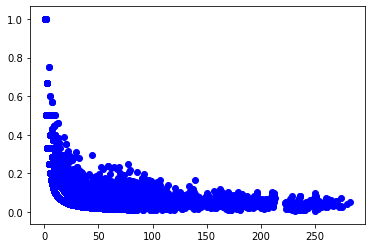

In [185]:
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

regr = RandomForestRegressor(max_depth=4, random_state=0)

# Scatter plot for original data
df_corretor = df_distribuicao_total[df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='INTERNO'][df_distribuicao_total.Taxa_semanal!=0][df_distribuicao_total.contagem_semana<300]
X_corretor = df_corretor[['contagem_semana']]
y_corretor = df_corretor['Taxa_semanal']
plt.scatter(X_corretor, y_corretor, color = 'blue') 

In [186]:
X_corretor_2 = np.arange(0,300,1)
regr.fit(X_corretor, y_corretor)

RandomForestRegressor(max_depth=4, random_state=0)

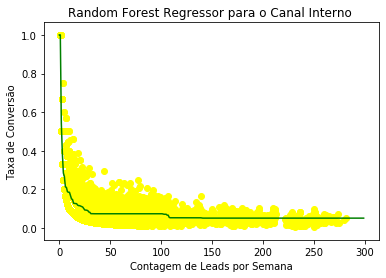

In [187]:
#Visualisng the linear regression model results
plt.scatter(X_corretor, y_corretor,color='yellow')
#plt.plot(X_corretor_2,lin_reg2.predict(X_poly),color='blue')
plt.plot(X_corretor_2,regr.predict(X_corretor_2.reshape(-1,1)),color='green')

plt.title('Random Forest Regressor para o Canal Interno ')
plt.xlabel('Contagem de Leads por Semana')
plt.ylabel('Taxa de Conversão')
plt.show()

<h3> Regressão - Canal Televendas </h3>

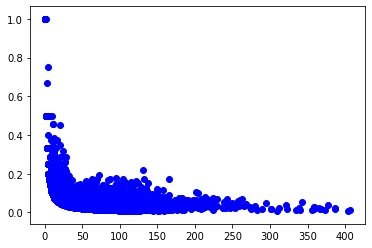

In [188]:
# Scatter plot for original data
df_corretor = df_distribuicao_total[df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='TELEVENDAS'][df_distribuicao_total.Taxa_semanal!=0]
X_corretor = df_corretor[['contagem_semana']]
y_corretor = df_corretor['Taxa_semanal']
plt.scatter(X_corretor, y_corretor, color = 'blue') 

In [189]:
#fitting the polynomial regression model to the dataset
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
poly_reg=PolynomialFeatures(degree=4)

poly_reg.fit(X_corretor)
X_poly=poly_reg.transform(X_corretor)

#lin_reg2=LinearRegression()
#lin_reg2.fit(X_poly,y_corretor)
regr.fit(X_corretor, y_corretor)

RandomForestRegressor(max_depth=4, random_state=0)

In [190]:
X_corretor_2 = np.arange(0,300,1)
X_poly=poly_reg.transform(X_corretor_2.reshape(-1,1))

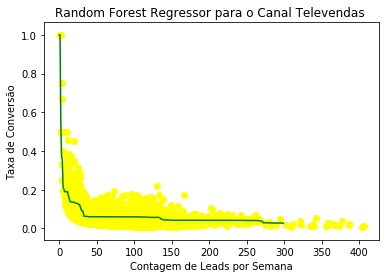

In [191]:
#Visualisng the linear regression model results
plt.scatter(X_corretor, y_corretor,color='yellow')
#plt.plot(X_corretor_2,lin_reg2.predict(X_poly),color='blue')
plt.plot(X_corretor_2,regr.predict(X_corretor_2.reshape(-1,1)),color='green')

plt.title('Random Forest Regressor para o Canal Televendas ')
plt.xlabel('Contagem de Leads por Semana')
plt.ylabel('Taxa de Conversão')
plt.show()

<h3> Regressão - Canal Externo </h3>

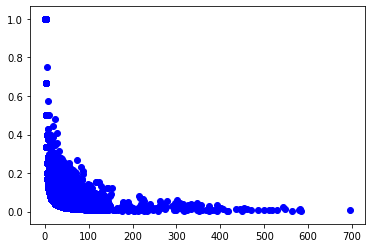

In [192]:
# Scatter plot for original data
df_corretor = df_distribuicao_total[df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='EXTERNO'][df_distribuicao_total.Taxa_semanal!=0]
X_corretor = df_corretor[['contagem_semana']]
y_corretor = df_corretor['Taxa_semanal']
plt.scatter(X_corretor, y_corretor, color = 'blue') 

In [193]:
#fitting the polynomial regression model to the dataset
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
poly_reg=PolynomialFeatures(degree=3)

poly_reg.fit(X_corretor)
X_poly=poly_reg.transform(X_corretor)

#lin_reg2=LinearRegression()
#lin_reg2.fit(X_poly,y_corretor)

regr = RandomForestRegressor(max_depth=4, random_state=0)
regr.fit(X_corretor, y_corretor)

RandomForestRegressor(max_depth=4, random_state=0)

In [194]:
X_corretor_2 = np.arange(0,180,1)
X_poly=poly_reg.transform(X_corretor_2.reshape(-1,1))

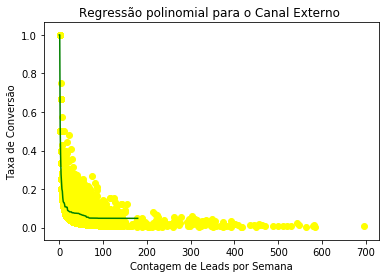

In [195]:
#Visualisng the linear regression model results
plt.scatter(X_corretor, y_corretor,color='yellow')
#plt.plot(X_corretor_2,lin_reg2.predict(X_poly),color='blue')
plt.plot(X_corretor_2,regr.predict(X_corretor_2.reshape(-1,1)),color='green')

plt.title('Regressão polinomial para o Canal Externo ')
plt.xlabel('Contagem de Leads por Semana')
plt.ylabel('Taxa de Conversão')
plt.show()

In [196]:
df_distribuicao_total

,Corretor,Taxa_semanal,semana,contagem_semana,convertidos_semana,CORRETOR_DISTRIBUICAO,CANAL_DISTRIBUICAO_NOVO,cluster
0,ADEMIR DE SOUZA DO AMPARO,0.0,1.0,1,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
1,ADEMIR DE SOUZA DO AMPARO,0.0,2.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
2,ADEMIR DE SOUZA DO AMPARO,0.0,3.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
3,ADEMIR DE SOUZA DO AMPARO,0.0,4.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
4,ADEMIR DE SOUZA DO AMPARO,0.0,5.0,0,0,ADEMIR DE SOUZA DO AMPARO,EXTERNO,A
...,...,...,...,...,...,...,...,...
118392,WISNER RONEY DA SILVA RODRIGUES,0.0,193.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,A
118393,WISNER RONEY DA SILVA RODRIGUES,0.0,194.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,A
118394,WISNER RONEY DA SILVA RODRIGUES,0.0,195.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,A
118395,WISNER RONEY DA SILVA RODRIGUES,0.0,196.0,0,0,WISNER RONEY DA SILVA RODRIGUES,INTERNO,A


In [197]:
distribuicao_soma_leads = df_distribuicao_total.groupby(['CANAL_DISTRIBUICAO_NOVO'])['contagem_semana'].sum().reset_index()
distribuicao_soma_leads.columns = ['CANAL_DISTRIBUICAO_NOVO', 'Total_leads']
distribuicao_soma_convertidos = df_distribuicao_total.groupby(['CANAL_DISTRIBUICAO_NOVO'])['convertidos_semana'].sum().reset_index()
distribuicao_soma_convertidos.columns = ['CANAL_DISTRIBUICAO_NOVO', 'Total_convertidos']

distribuicao_capacity_0 = df_distribuicao_total[df_distribuicao_total.cluster=='A'].groupby(['CANAL_DISTRIBUICAO_NOVO']).agg({'contagem_semana':['sum','max'], 'convertidos_semana':'sum'}).reset_index()
distribuicao_capacity_1 = df_distribuicao_total[df_distribuicao_total.cluster=="B"].groupby(['CANAL_DISTRIBUICAO_NOVO']).agg({'contagem_semana':['sum','max'], 'convertidos_semana':'sum'}).reset_index()
distribuicao_capacity_2 = df_distribuicao_total[df_distribuicao_total.cluster=='C'].groupby(['CANAL_DISTRIBUICAO_NOVO']).agg({'contagem_semana':['sum','max'], 'convertidos_semana':'sum'}).reset_index()

In [198]:
distribuicao_capacity_0[['leads_1','capacity_1', 'converted_1']] = distribuicao_capacity_1[['contagem_semana', 'convertidos_semana']]
distribuicao_capacity_0[['leads_2','capacity_2', 'converted_2']] = distribuicao_capacity_2[['contagem_semana', 'convertidos_semana']]
distribuicao_capacity_0['Total_leads'] = distribuicao_soma_leads['Total_leads']
distribuicao_capacity_0['Total_convertidos'] = distribuicao_soma_convertidos['Total_convertidos']

distribuicao_capacity_0['Taxa_conversao'] = distribuicao_capacity_0['Total_convertidos']/distribuicao_capacity_0['Total_leads']

In [199]:
distribuicao_capacity_0['tx_0'] = distribuicao_capacity_0['convertidos_semana']['sum']/distribuicao_capacity_0['contagem_semana']['sum']
distribuicao_capacity_0['tx_1'] = distribuicao_capacity_0['converted_1']/distribuicao_capacity_0['leads_1']
distribuicao_capacity_0['tx_2'] = distribuicao_capacity_0['converted_2']/distribuicao_capacity_0['leads_2']

In [218]:
cap1_interno = 37
cap1_externo = 31
cap1_televendas = 50
cap2_interno = 139
cap2_televendas = 156
cap2_externo = 188

print(f'Capacidade 1: Externo - {cap1_externo}, Interno - {cap1_interno}, Televendas - {cap1_televendas}; Capacidade 2: Externo - {cap2_externo}, Interno - {cap2_interno}, Televendas - {}')

Capacidade 1: Externo - 31, Interno - 37, Televendas - 50; Capacidade 2: Externo - 188, Interno - 139, Televendas - 156


In [200]:
distribuicao_capacity_0

CANAL_DISTRIBUICAO_NOVO contagem_semana     convertidos_semana leads_1  \
                                      sum max                sum           
0                 EXTERNO           96708  31               4864  201802   
1                 INTERNO           50613  37               3909  116711   
2              TELEVENDAS           16574  50               1309  124837   

  capacity_1 converted_1 leads_2 capacity_2 converted_2 Total_leads  \
                                                                      
0        188        9352   39062        695         685      337572   
1        139        7993   90318        393        4276      257642   
2        156        6980   43926        406        1647      185337   

  Total_convertidos Taxa_conversao      tx_0      tx_1      tx_2  
                                                                  
0             14901       0.044142  0.050296  0.046342  0.017536  
1             16178       0.062793  0.077233  0.068485  0.047344  
2              9936       0.053610  0.078979  0.055913  0.037495

<h3> Avaliação de capabilidade: Cp e Cpk </h3>

$$Cp = \frac{USL-LSL}{6\sigma}$$
$$Cpk = Min\left(\frac{USL-\mu}{3\sigma},\frac{\mu-LSL}{3\sigma}\right)$$

In [202]:
def cp(std, LSL, USL):
    return (USL-LSL)/(std+0.0001)

def cpk(mean, std, LSL, USL):
    return min((USL-mean)/(std+0.0001),(mean-LSL)/(std+0.0001))
def std(x): 
    return np.std(x)

<h3> Interno </h3>
<li> <b>LSL</b> : limite inferior = 37</li> <li> <b>USL</b>: limite superior = 139 </li>

In [203]:
cp_interno = df_distribuicao_total[df_distribuicao_total.contagem_semana!=0][df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='INTERNO'].groupby('Corretor')['contagem_semana'].agg(['mean', std]).reset_index()
cp_interno.columns = ['corretor', 'mu', 'sigma']

cp_interno['cpk'] = cp_interno.apply(lambda df: cpk(df['mu'], df['sigma'], 37, 139), axis=1)

cp_interno.sort_values('cpk', ascending=False)

,corretor,mu,sigma,cpk
17,ANDRINA FERNANDES LEAL,59.000000,24.334903,0.904048
77,JULIANA HELEN QUINTEIRO COSTABILE,89.109948,72.695546,0.686287
3,ADRIANO TIMOTEO DE OLIVEIRA,90.565217,74.091571,0.653714
135,RENATA GOMES CAMPELONGO CORREA,96.104712,71.736644,0.597954
9,ANA KATIA LOPES DA SILVA,98.483871,71.748308,0.564697
36,DANIELLA DE CAMARGO PINHO,104.554348,67.905763,0.507256
170,WAGNER LEONARDI ROSSI,105.978378,67.797469,0.487062
41,EDSON FERRAZ DA SILVA,109.865031,66.764628,0.436383
129,RAQUEL DA SILVA SOUZA,110.491018,67.152777,0.424539
90,LEANDRO SANTOS OLIVEIRA,111.780645,70.487910,0.386156


<h3> Televendas </h3>
<li> <b>LSL</b> : limite inferior = 50</li> <li> <b>USL</b>: limite superior = 156 </li>

In [204]:
cp_televendas = df_distribuicao_total[df_distribuicao_total.contagem_semana!=0][df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='TELEVENDAS'].groupby('Corretor')['contagem_semana'].agg(['mean', std]).reset_index()
cp_televendas.columns = ['corretor', 'mu', 'sigma']

cp_televendas['cpk'] = cp_televendas.apply(lambda df: cpk(df['mu'], df['sigma'],50, 156), axis=1)

cp_televendas.sort_values('cpk', ascending=False)

,corretor,mu,sigma,cpk
1,ALINE SILVA,84.210526,36.626247,0.934041
10,EDILMA PEREIRA DA COSTA,76.555556,36.040444,0.736824
5,ANAILDES SANTOS FERREIRA,97.567308,71.314952,0.667002
4,ANA PAULA SOARES,89.647059,67.446466,0.587829
20,LEANDRO RODRIGUES SIQUEIRA,84.587571,65.225419,0.530277
34,VANESSA DE OLIVEIRA BEZERRA LEMOS,100.428571,96.846748,0.520704
32,TAMIRES ALVES DE OLIVEIRA,81.088050,62.341662,0.498671
23,LUANA PAULA RODRIGUES RIBEIRO DA COSTA,99.000000,98.803429,0.495934
28,SARA PANOBIANCO CONSTANTINO,76.308824,57.589383,0.456834
12,FABIANA DE MORAIS SILVEIRA,80.575540,67.163066,0.455243


<h3> Externo </h3>
<li> <b>LSL</b> : limite inferior = 31</li> <li> <b>USL</b>: limite superior = 188 </li>

In [205]:
cp_externo = df_distribuicao_total[df_distribuicao_total.contagem_semana!=0][df_distribuicao_total.CANAL_DISTRIBUICAO_NOVO=='EXTERNO'].groupby('Corretor')['contagem_semana'].agg(['mean', std]).reset_index()
cp_externo.columns = ['corretor', 'mu', 'sigma']

cp_externo['cpk'] = cp_externo.apply(lambda df: cpk(df['mu'], df['sigma'], 31, 188), axis=1)

cp_externo.sort_values('cpk', ascending=False)

,corretor,mu,sigma,cpk
22,ANA PAULA DANGELO,83.148936,38.019580,1.371630
61,CHRISTIANE MACIEL DA SILVA,53.204082,18.392522,1.207228
13,AMANDA OLIVEIRA,56.467742,33.191389,0.767297
207,LEONARDO FERREIRA FALCĂO,92.153846,81.431515,0.750984
327,ROSILENE ANGELO GOMES AMORIM,48.432099,23.423075,0.744224
...,...,...,...,...
25,ANDERSON DA SILVA MENDES,1.000000,0.000000,-300000.000000
198,KEVIN LIMA BRANDĂO,1.000000,0.000000,-300000.000000
148,GLORIA LOPES,1.000000,0.000000,-300000.000000
31,ANDREIA CAMPOS DE JESUS SILVA,1.000000,0.000000,-300000.000000


In [206]:
cp = pd.concat([cp_interno, cp_externo, cp_televendas])

In [207]:
df_cp['corretor'] = df_cp['Corretor']

In [208]:
cp = pd.merge(cp, df_cp, on='corretor', how='inner')

In [209]:
cp

,corretor,mu,sigma,cpk,Corretor,A,B,C,cluster_capacity
0,ADRIANA ALVES DOS SANTOS,16.375000,8.572303,-2.405977,ADRIANA ALVES DOS SANTOS,0.0,8.0,0.0,B
1,ADRIANA DE SOUZA OLIVEIRA,11.821429,5.203389,-4.838787,ADRIANA DE SOUZA OLIVEIRA,0.0,28.0,0.0,B
2,ADRIANA MARIA ROMEIRO NORONHA,16.250000,7.822244,-2.652658,ADRIANA MARIA ROMEIRO NORONHA,0.0,8.0,0.0,B
3,ADRIANO TIMOTEO DE OLIVEIRA,90.565217,74.091571,0.653714,ADRIANO TIMOTEO DE OLIVEIRA,95.0,47.0,42.0,C
4,AGNALDO OLIVEIRA DA MATA,14.000000,9.000000,-2.555527,AGNALDO OLIVEIRA DA MATA,0.0,2.0,0.0,B
...,...,...,...,...,...,...,...,...,...
595,THAIS CRISTINA JORGE,52.511111,44.193324,0.056821,THAIS CRISTINA JORGE,49.0,39.0,2.0,C
596,VANESSA DE OLIVEIRA BEZERRA LEMOS,100.428571,96.846748,0.520704,VANESSA DE OLIVEIRA BEZERRA LEMOS,7.0,10.0,4.0,C
597,VANESSA PAULINO FERREIRA,19.812500,23.305629,-1.295282,VANESSA PAULINO FERREIRA,13.0,3.0,0.0,B
598,WESLEY MACHADO SANTANA,2.555556,1.165343,-40.709359,WESLEY MACHADO SANTANA,9.0,0.0,0.0,A


<h3> Corretores para Distribuicao </h3>

In [237]:
df_corretores = df_corretores[~df_corretores.Corretor.isin(lista_corretores_tirar)]

In [238]:
#distribuição diariamente
def capacity(canal):
    if canal=='INTERNO':
        return int(cap1_interno/5+1)
    if canal=='EXTERNO':
        return int(cap1_externo/5+1)
    if canal=='TELEVENDAS':
        return int(cap1_televendas/5+1)

In [239]:
df_corretores['capacity'] = df_corretores.CANAL_DISTRIBUICAO_NOVO.apply(capacity)

In [240]:
df_corretores = pd.merge(df_corretores, cp[['Corretor','cpk']], on='Corretor', how='left')

In [245]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
df_corretores['corretor_id'] =  OrdinalEncoder().fit_transform(df_corretores.Corretor.values.reshape(-1,1))

In [247]:
df_corretores.to_csv('corretores_ativos.csv')

<h3> Avaliação diária por corretor </h3>

In [112]:
df = pd.read_csv('new_baseunificada_2017.csv')

In [113]:
base_corretores = pd.read_excel('resultado_cluster.xlsx')

In [114]:
base_corretores

,CORRETOR_DISTRIBUICAO,score_corretor_norm,cluster,decil
0,ANAILDES SANTOS FERREIRA,0.4,B,"D.0,3 - 0,4"
1,BRUNO CAVALCANTE MUNIZ,0.55,B,"F.0,5 - 0,6"
2,SADRAQUI DE AZEVEDO NEVES,0.19,B,"B.0,1 - 0,2"
3,LEANDRO SANTOS OLIVEIRA,0.59,A,"F.0,5 - 0,6"
4,BRUNA PINA DA SILVA,0.61,A,"G.0,6 - 0,7"
5,CECILIA FERNANDES SILVA,0.55,A,"F.0,5 - 0,6"
6,ROSELI APARECIDA PEREIRA PASSO,0.45,B,"E.0,4 - 0,5"
7,WAGNER LEONARDI ROSSI,0.63,A,"G.0,6 - 0,7"
8,JULIANA ANTUNES SACCO,0.65,A,"G.0,6 - 0,7"
9,ANA CAROLINA SOARES DA CRUZ,0.41,B,"E.0,4 - 0,5"


In [115]:
corretores_A = base_corretores[base_corretores.cluster=='A'].CORRETOR_DISTRIBUICAO

In [116]:
corretores_B = base_corretores[base_corretores.cluster=='B'].CORRETOR_DISTRIBUICAO

In [117]:
corretores = np.concatenate([corretores_A, corretores_B])

In [118]:
df.CORRETOR_DISTRIBUICAO = df.CORRETOR_DISTRIBUICAO.str.upper().replace(dict_nomes_corrigir)

In [119]:
df = df[df.CORRETOR_DISTRIBUICAO.isin(corretores)]

In [120]:
df.shape

(604080, 75)

In [121]:
df

,Unnamed: 0,DATAGERACAOLEAD,data_referencia_relatorio,idLeadSimulador,NM_ORIGEM,GRUPOORIGEM,CANAL_HOMOLOGACAO,ANO_MES_REFERENCIA,FLGVENDASAUDE,VENDASAUDE90DIAS,VENDASAUDE120DIAS,MESVENDASAUDE,FORMABUSCAVENDA,QUANTIDADEVIDASVENDASAUDE,QUANTIDADEDIASVENDASAUDE,PRACA,CANAL_DISTRIBUICAO,ID_CHAVE,ID_ETL,numdbm,QUANTIDADELEADS,MIDIA,TICKET_MEDIO,TEMPO_PERMANENCIA_DIAS,STATUS_PLANO,ORIGEM_DE_MIDIA_VEICULO,ORIGEM_DE_MIDIA_FORMATO,ORIGEM_DE_MIDIA_CAMPANHA,ENTIDADE,PLANO,numeroProposta,SEXO,CHURN_DIAS,DS_ORIGEM_MIDIA,CIDADE,ESTADO,EntidadeLead,Canal_Venda,FlClienteAtivo,tempoMedioAtendimento,tempoEntrega,dtAtribuicao,DATA_NASCIMENTO,ds_profissao,flcrmzen,Projeto_origem,Oberservacao,DATA_ATRIBUICAO_1şCONSULTOR,1şCONSULTOR,1şSUPERVISOR,2şCONSULTOR,3şCONSULTOR,4şCONSULTOR,CONSULTOR_ATUALIZADO,SUPERVISOR_ATUALIZADO,GERENTE_ATUALIZADO,STATUS_PRIMEIRO_RESULTADO,STATUS_ULTIMO_RESULTADO,DATA_ULTIMO_RESULTADO,CANAL_DISTRIBUICAO_NOVO,CORRETOR_DISTRIBUICAO,CANAL_CORRETOR_VENDA,data_redistribuicao,Consultor_Redistribuiçăo,Motivo_Redistribuicao,ORDEM,ID_LEAD,filtro_praca,filtro_origem,filtro_cliente_ativo,Filtro,dia_de_semana,Hora_atribuida,Hora_atribuida_dt_geracao,Tempo_atribuicao
0,0,02/01/2019 10:40:17,2019-01-02,3766417.0,Sim Mobile,Mobile,Isabela Tavares Zanelato,2019-01,N,0.0,0.0,NaN,NaN,NaN,NaN,BA,INTERNO,104815110.0,394584.0,NaN,1.0,NaN,NaN,NaN,NaN,ybox,email,alwayson_br_email_jul18_2372,NaN,NaN,NaN,NaN,NaN,NaN,salvador,BA,UNE,NaN,FALSE,24:28:00,00:23,02/01/2019 11:02:28,1989-10-30,estudante universitario,0.0,SIMULADOR_WEB,EM NEGOCIAÇĂO.,2019-01-02,Isabela Tavares Zanelato,Isabela Tavares Zanelato,Fabiana de Morais Silveira,NaN,NaN,Fabiana de Morais Silveira,Isabela Tavares Zanelato,Jose Carlos Da Silva,Em Atendimento,Em Atendimento,2019-01-07,TELEVENDAS,FABIANA DE MORAIS SILVEIRA,PROPRIO,NaN,NaN,NaN,1.0,104815110/394584,1,1,1,True,2,11.0,10,-0.369722
1,1,02/01/2019 10:41:27,2019-01-02,3766423.0,Sim Detalhe do Plano,Detalhe do Plano,Isabela Tavares Zanelato,2019-01,N,0.0,0.0,NaN,NaN,NaN,NaN,DF,INTERNO,104815116.0,394584.0,NaN,1.0,NaN,NaN,NaN,NaN,qualicorp,display,Carrossel-Botao-Amarelo,NaN,NaN,NaN,NaN,NaN,NaN,brasilia,DF,SASPB,NaN,FALSE,50:43:00,00:22,02/01/2019 11:02:28,1974-04-01,funcionario publico,0.0,SIMULADOR_WEB,NaN,2019-01-02,Isabela Tavares Zanelato,Isabela Tavares Zanelato,Roseli Aparecida Pereira Passo,NaN,NaN,Roseli Aparecida Pereira Passo,Isabela Tavares Zanelato,Jose Carlos Da Silva,Em Atendimento,Em Atendimento,2019-01-10,TELEVENDAS,ROSELI APARECIDA PEREIRA PASSO,PROPRIO,NaN,NaN,NaN,1.0,104815116/394584,1,1,1,True,2,11.0,10,-0.350278
2,2,02/01/2019 10:41:58,2019-01-02,3766424.0,Sim Mobile,Mobile,Isabela Tavares Zanelato,2019-01,N,0.0,0.0,NaN,NaN,NaN,NaN,PB,INTERNO,104815117.0,394584.0,NaN,1.0,NaN,NaN,NaN,NaN,google,search,pernambuco_planosdesaude_search_search_desktop...,NaN,NaN,NaN,NaN,NaN,NaN,joao pessoa,PB,ABRACEM,NaN,FALSE,06:03:00,00:21,02/01/2019 11:02:28,1962-02-23,profissional liberal,0.0,SIMULADOR_WEB,NaN,2019-01-02,Isabela Tavares Zanelato,Isabela Tavares Zanelato,Anaildes Santos Ferreira,NaN,NaN,Anaildes Santos Ferreira,Isabela Tavares Zanelato,Jose Carlos Da Silva,Em Atendimento,Em Atendimento,2019-01-02,TELEVENDAS,ANAILDES SANTOS FERREIRA,PROPRIO,NaN,NaN,NaN,1.0,104815117/394584,1,1,1,True,2,11.0,10,-0.341667
3,3,02/01/2019 10:42:47,2019-01-02,3766433.0,Sim Captura,Captura,Franquia Manaus,2019-01,N,0.0,0.0,NaN,NaN,NaN,NaN,AM,FRANQUIAS,104815125.0,394584.0,NaN,1.0,NaN,NaN,NaN,NaN,ybox,email,alwayson_br_email_abr17,NaN,NaN,NaN,NaN,NaN,NaN,manaus,AM,UBES,NaN,FALSE,00:04:00,00:20,02/01/2019 11:02:28,2003-10-27,estudante do ensino medio ou fundamental,0.0,SIMULADOR_WEB,NaN,2019-01-02,Thiago Lima Carvalho,Thiago Lima Carvalho,Irami Rios Tapudima,NaN,NaN,Irami Rios Tapudima,Thiago Lima Carvalho,Wellington Domingues Castelo Branco,Em Atendimento,Em Atendimento,2019-01-02,EXTERNO,IRAMI RIOS TAPUDIMA,TERCEIRO,NaN,NaN,NaN,1.0,104815125/394584,1,1,1,True,2,11.0,10,-0.328056
4,4,02/01/2019 10:43:20,2019-01-02,3766435.0,Sim C

In [122]:
df['data_referencia_relatorio'] = pd.to_datetime(df['data_referencia_relatorio'])
df = df.sort_values('data_referencia_relatorio').reset_index()

df.data_referencia_relatorio = df.data_referencia_relatorio.dt.strftime('%Y-%m-%d')

df = df[~(df.data_referencia_relatorio<'1900-02-01')]

i=0
dia = np.zeros(len(df))
DATAGERACAOLEAD = 3
for i in range(len(df)):
    if df.iloc[i-1,DATAGERACAOLEAD] != df.iloc[i,DATAGERACAOLEAD]:
        dia[i] = dia[i-1]+1
    else:
        dia[i] = dia[i-1]
        
df['dia'] = dia

lista_corretores_2 = df[df.FLGVENDASAUDE=='Y'].CORRETOR_DISTRIBUICAO.value_counts().index
df = df[df.CORRETOR_DISTRIBUICAO.isin(lista_corretores_2)]
df = df[~df.CORRETOR_DISTRIBUICAO.isin(['NĂO DISTRIBUIDO'])]

In [123]:
df['key'] = df['CORRETOR_DISTRIBUICAO'].astype(str)+'_'+df['dia'].astype(str)

df_count_dia = df.groupby(['CORRETOR_DISTRIBUICAO', 'dia'])['FLGVENDASAUDE'].count().unstack(fill_value=0).stack().reset_index()
df_count_converted_dia = df[df.FLGVENDASAUDE=='Y'].groupby(['CORRETOR_DISTRIBUICAO', 'dia'])['FLGVENDASAUDE'].count().unstack(fill_value=0).stack().reset_index()

df_count_dia = df_count_dia.replace(np.NaN, 0)
df_count_converted_dia = df_count_converted_dia.replace(np.NaN, 0)

df_count_dia.columns = ['CORRETOR_DISTRIBUICAO', 'dia', 'Leads']

df_count_dia['Key'] = df_count_dia['CORRETOR_DISTRIBUICAO']+'_'+df_count_dia['dia'].astype('str')

df_count_converted_dia.columns = ['CORRETOR_DISTRIBUICAO', 'dia', 'Convertidos']

df_count_converted_dia['Key'] = df_count_converted_dia['CORRETOR_DISTRIBUICAO']+'_'+df_count_converted_dia['dia'].astype('str')

df_count_dia = pd.merge(df_count_dia, df_count_converted_dia[['Key', 'Convertidos']] , on='Key', how='inner' )

df_capacity = pd.DataFrame()
df_capacity['Corretor'] = df_count_dia['CORRETOR_DISTRIBUICAO']
df_capacity['Taxa_dia'] = df_count_dia['Convertidos']/df_count_dia['Leads']
df_capacity['dia']  = df_count_dia['dia']
df_capacity['contagem_dia']  = df_count_dia['Leads']
df_capacity['convertidos_dia']  = df_count_converted_dia['Convertidos']

df_capacity = pd.merge(df_capacity, df_distribuição, how='inner', left_on='Corretor', right_on='CORRETOR_DISTRIBUICAO')
#retira corretores com capacidade infinita
#df_capacity_2 = df_capacity[~df_capacity.Corretor.isin(['Năo Distribuido', 'Consultor Wooza', 'Isabela Tavares Zanelato', 'Jose Carlos Da Silva', 'Márcio Velloso de Lima'])]

In [125]:
df_capacity['key'] = df_capacity['Corretor'].astype(str)+'_'+df_capacity['dia'].astype(str)

In [126]:
df_capacity_2 = df_capacity[~df_capacity.Corretor.isin(['NĂO DISTRIBUIDO', 'CONSULTOR WOOZA', 'ISABELA TAVARES ZANELATO', 'JOSE CARLOS DA SILVA', 'MÁRCIO VELLOSO DE LIMA'])]

In [127]:
df_capacity_2

,Corretor,Taxa_dia,dia,contagem_dia,convertidos_dia,CORRETOR_DISTRIBUICAO,CANAL_DISTRIBUICAO_NOVO,key
0,ADRIANE DE MIRANDA JONES,0.130435,1.0,23,3,ADRIANE DE MIRANDA JONES,EXTERNO,ADRIANE DE MIRANDA JONES_1.0
1,ADRIANE DE MIRANDA JONES,0.083333,2.0,12,1,ADRIANE DE MIRANDA JONES,EXTERNO,ADRIANE DE MIRANDA JONES_2.0
2,ADRIANE DE MIRANDA JONES,0.000000,3.0,8,0,ADRIANE DE MIRANDA JONES,EXTERNO,ADRIANE DE MIRANDA JONES_3.0
3,ADRIANE DE MIRANDA JONES,0.181818,4.0,11,2,ADRIANE DE MIRANDA JONES,EXTERNO,ADRIANE DE MIRANDA JONES_4.0
4,ADRIANE DE MIRANDA JONES,0.000000,5.0,7,0,ADRIANE DE MIRANDA JONES,EXTERNO,ADRIANE DE MIRANDA JONES_5.0
...,...,...,...,...,...,...,...,...
185080,WAGNER LEONARDI ROSSI,0.000000,1396.0,5,0,WAGNER LEONARDI ROSSI,INTERNO,WAGNER LEONARDI ROSSI_1396.0
185081,WAGNER LEONARDI ROSSI,0.000000,1397.0,1,0,WAGNER LEONARDI ROSSI,INTERNO,WAGNER LEONARDI ROSSI_1397.0
185082,WAGNER LEONARDI ROSSI,0.000000,1399.0,5,0,WAGNER LEONARDI ROSSI,INTERNO,WAGNER LEONARDI ROSSI_1399.0
185083,WAGNER LEONARDI ROSSI,0.000000,1400.0,6,0,WAGNER LEONARDI ROSSI,INTERNO,WAGNER LEONARDI ROSSI_1400.0


In [128]:
key_valid_2 = df_capacity_2[df_capacity_2.Taxa_dia>=0.1].key
key_valid_1 = df_capacity[(df_capacity.Corretor.isin(corretores_A))&(df_capacity.Taxa_dia>=0.05)&(df_capacity.contagem_dia>10)].key
key_valid = np.concatenate([key_valid_1,key_valid_2])

In [129]:
key_valid.shape

(17842,)

In [130]:
df[df['key'].isin(key_valid_1)].shape

(125090, 78)

In [131]:
df_0 = df[df.FLGVENDASAUDE=='N'][df['key'].isin(key_valid_1)]

In [132]:
df_0.shape

(112118, 78)

In [133]:
df_1 = df[df.FLGVENDASAUDE=='Y']

In [134]:
df_1.shape

(33391, 78)

In [135]:
pd.concat([df_0,df_1]).to_csv('new_baseunificada_b.csv')

In [136]:
df_capacity_2[df_capacity_2.Corretor=='ROSILENE ANGELO GOMES AMORIM']

,Corretor,Taxa_dia,dia,contagem_dia,convertidos_dia,CORRETOR_DISTRIBUICAO,CANAL_DISTRIBUICAO_NOVO,key
160407,ROSILENE ANGELO GOMES AMORIM,NaN,1.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_1.0
160408,ROSILENE ANGELO GOMES AMORIM,NaN,2.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_2.0
160409,ROSILENE ANGELO GOMES AMORIM,NaN,3.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_3.0
160410,ROSILENE ANGELO GOMES AMORIM,NaN,4.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_4.0
160411,ROSILENE ANGELO GOMES AMORIM,NaN,5.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_5.0
...,...,...,...,...,...,...,...,...
161773,ROSILENE ANGELO GOMES AMORIM,NaN,1396.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_1396.0
161774,ROSILENE ANGELO GOMES AMORIM,NaN,1397.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_1397.0
161775,ROSILENE ANGELO GOMES AMORIM,NaN,1399.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_1399.0
161776,ROSILENE ANGELO GOMES AMORIM,NaN,1400.0,0,0,ROSILENE ANGELO GOMES AMORIM,EXTERNO,ROSILENE ANGELO GOMES AMORIM_1400.0


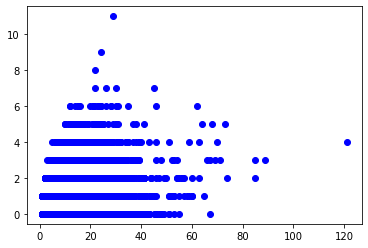

In [137]:
df_corretor = df_capacity_2[df_capacity_2.CANAL_DISTRIBUICAO_NOVO=='EXTERNO'][df_capacity_2.contagem_dia>=1]

X_corretor = df_corretor['contagem_dia']
y_corretor = df_corretor['convertidos_dia']
plt.scatter(X_corretor, y_corretor, color = 'blue') 

In [138]:
fig = px.scatter(df_capacity_2[df_capacity_2.contagem_dia>=1], x="convertidos_dia", y="contagem_dia", color='CANAL_DISTRIBUICAO_NOVO',
                labels={
                     "convertidos_dia": "Leads Convertidos por dia",
                     "contagem_dia": "Leads Atríbuidos por dia"})
fig.update_layout(title=f'Distribuição por canal diário')
fig.show()

$$P(Converter_X |Recebeu_y) = \frac{P(Receber_y|Converteu_X)P(Converter_X)}{P(Receber_y)}$$

In [139]:
def calcula_leads_necessarios(prob_esperada, convertidos, tipo, canal='INTERNO', corretor = 'ROSILENE ANGELO GOMES AMORIM'):
    #tipo: 0 - corretor, 1 - canal
    i=1
    prob = 0
    if tipo==0:
        while prob < prob_esperada/100:
            try:
                df_corretor = df_capacity_2[df_capacity_2.CORRETOR_DISTRIBUICAO==corretor][df_capacity_2.contagem_dia.between(1,i)]
                prob = len(df_corretor[df_corretor.convertidos_dia>=convertidos])/(len(df_corretor))
                i+=1
            except ZeroDivisionError:
                return -1
                break
            if i>100:
                break
        return i
    else:
        while prob < prob_esperada/100:
            try:
                df_canal = df_capacity_2[df_capacity_2.CANAL_DISTRIBUICAO_NOVO==canal][df_capacity_2.contagem_dia.between(1,i)]
                prob = len(df_canal[df_canal.convertidos_dia>=convertidos])/(len(df_canal))
                i+=1
            except ZeroDivisionError:
                return -1
                break
            if i>100:
                break
        return i
def calcula_chance_conversao(n_leads, corretor, convertidos):
        df_corretor = df_capacity_2[df_capacity_2.CORRETOR_DISTRIBUICAO==corretor][df_capacity_2.contagem_dia.between(1,n_leads)]
        try:
            prob = len(df_corretor[df_corretor.convertidos_dia>=convertidos])/(len(df_corretor))
        except ZeroDivisionError:
            return -1
        return prob
    
def calcula_chance_conversao_bayes(n_leads, corretor, convertidos, canal):
    try:
        #conta apenas dias com contagem positiva
        df_corretor = df_capacity_2[df_capacity_2.CORRETOR_DISTRIBUICAO==corretor][df_capacity_2.contagem_dia>0]
        #conta por canal
        df_canal = df_capacity_2[df_capacity_2.CANAL_DISTRIBUICAO_NOVO==canal][df_capacity_2.contagem_dia>0]
        #probabilidade de receber n_leads ou menos
        P_receber = len(df_canal[df_canal.contagem_dia<=n_leads])/(len(df_canal))
        #probabilidade de converter n convertidos ou mais
        P_converter = len(df_corretor[df_corretor.convertidos_dia>=convertidos])/(len(df_corretor))
        #probabilidade de receber y ou menos leads dado que converteu x ou mais
        P_RC = len(df_corretor[df_corretor.contagem_dia<=n_leads][df_corretor.convertidos_dia>=convertidos])/len(df_corretor[df_corretor.convertidos_dia>=convertidos])
        prob = (P_RC*P_converter)/P_receber
    except ZeroDivisionError:
        return -1
    return prob

In [140]:
cp_interno2 = cp_interno[cp_interno.corretor.isin(corretores)]

#chance de converter pelo menos um lead dados que entregou no máximo 20 leads. Abordagem bayesiana

cp_interno2['chance_bayes'] = cp_interno2.corretor.apply(lambda corretor: calcula_chance_conversao_bayes(n_leads = 30, corretor = corretor, convertidos = 1, canal='INTERNO'))
cp_interno2['chance_bayes_20'] = cp_interno2.corretor.apply(lambda corretor: calcula_chance_conversao_bayes(n_leads = 20, corretor = corretor, convertidos = 1, canal='INTERNO'))
cp_interno2['chance_bayes_40'] = cp_interno2.corretor.apply(lambda corretor: calcula_chance_conversao_bayes(n_leads = 40, corretor = corretor, convertidos = 1, canal='INTERNO'))
cp_interno2['chance_bayes_50'] = cp_interno2.corretor.apply(lambda corretor: calcula_chance_conversao_bayes(n_leads = 50, corretor = corretor, convertidos = 1, canal='INTERNO'))

#chance de converter pelo menos um lead dados que entregou no máximo 20 leads. Abordagem frequentista
cp_interno2['chance'] = cp_interno2.corretor.apply(lambda corretor: calcula_chance_conversao(n_leads = 30, corretor = corretor, convertidos = 2))

cp_interno2.sort_values('cpk', ascending=False)

,corretor,mu,sigma,cpk,chance_bayes,chance_bayes_20,chance_bayes_40,chance_bayes_50,chance
31,JULIANA HELEN QUINTEIRO COSTABILE,124.797980,73.320244,0.261892,0.484419,0.446565,0.513000,0.525518,0.217391
2,ADRIANO TIMOTEO DE OLIVEIRA,125.326531,73.638219,0.253584,0.468123,0.431596,0.503964,0.520948,0.210677
57,RENATA GOMES CAMPELONGO CORREA,127.959596,73.838470,0.217236,0.489267,0.442459,0.520135,0.531463,0.198790
17,DANIELLA DE CAMARGO PINHO,128.363636,73.367410,0.213124,0.498719,0.442339,0.531034,0.544079,0.204525
73,WAGNER LEONARDI ROSSI,131.727273,72.527364,0.169215,0.510807,0.434642,0.540550,0.552458,0.223028
5,ANA KATIA LOPES DA SILVA,131.959596,72.053841,0.167103,0.493176,0.452337,0.514135,0.530217,0.205365
37,LEANDRO SANTOS OLIVEIRA,132.308511,73.231929,0.159650,0.483336,0.418278,0.529503,0.547268,0.220705
20,EDSON FERRAZ DA SILVA,132.425532,73.080761,0.158379,0.481700,0.442791,0.513976,0.526689,0.228659
56,RAQUEL DA SILVA SOUZA,136.382979,71.593282,0.106393,0.476792,0.424804,0.506880,0.522147,0.223529
55,RAPHAEL ZIBINI LAMUCIO,139.738095,73.214642,0.058211,0.503853,0.443446,0.544010,0.564941,0.218994


In [141]:
chance_bayes = []
for corretor in cp_interno2.corretor.unique():
    for i in range(10,100,5):
        chance_bayes.append(calcula_chance_conversao_bayes(n_leads = i, corretor = corretor, convertidos = 1, canal='TELEVENDAS'))

chance_bayes = pd.DataFrame(np.array(chance_bayes).reshape(cp_interno2.corretor.nunique(),18))
chance_bayes.columns = range(10,100,5)
chance_bayes.index = cp_interno2.corretor.unique()

# Create traces
import plotly.graph_objects as go
fig = go.Figure()
for col in chance_bayes.T.columns:
    fig.add_trace(go.Scatter(x=chance_bayes.T.index, y=chance_bayes.T[col],
                    mode='lines', name=col))
fig.update_layout(title='Probabilidade de Converter um Lead no Dia - Canal Interno',
                   xaxis_title='Número de Leads Distribuídos ao Corretor',
                   yaxis_title='Probabilidade de Conversão')

fig.show()

In [142]:
chance_bayes = []
for corretor in cp_televendas2.corretor.unique():
    for i in range(10,100,5):
        chance_bayes.append(calcula_chance_conversao_bayes(n_leads = i, corretor = corretor, convertidos = 1, canal='TELEVENDAS'))

chance_bayes = pd.DataFrame(np.array(chance_bayes).reshape(cp_televendas2.corretor.nunique(),18))
chance_bayes.columns = range(10,100,5)
chance_bayes.index = cp_televendas2.corretor.unique()

# Create traces
import plotly.graph_objects as go
fig = go.Figure()
for col in chance_bayes.T.columns:
    fig.add_trace(go.Scatter(x=chance_bayes.T.index, y=chance_bayes.T[col],
                    mode='lines', name=col))
fig.update_layout(title='Probabilidade de Converter um Lead no Dia - Canal Televendas',
                   xaxis_title='Número de Leads Distribuídos ao Corretor',
                   yaxis_title='Probabilidade de Conversão')

fig.show()

NameError: name 'cp_televendas2' is not defined

In [ ]:
chance_bayes = []
for corretor in cp_externo2.corretor.unique():
    for i in range(10,100,5):
        chance_bayes.append(calcula_chance_conversao_bayes(n_leads = i, corretor = corretor, convertidos = 1, canal='EXTERNO'))

chance_bayes = pd.DataFrame(np.array(chance_bayes).reshape(cp_externo2.corretor.nunique(),18))
chance_bayes.columns = range(10,100,5)
chance_bayes.index = cp_externo2.corretor.unique()

# Create traces
import plotly.graph_objects as go
fig = go.Figure()
for col in chance_bayes.T.columns:
    fig.add_trace(go.Scatter(x=chance_bayes.T.index, y=chance_bayes.T[col],
                    mode='lines', name=col))
fig.update_layout(title='Probabilidade de Converter um Lead no Dia - Canal Externo',
                   xaxis_title='Número de Leads Distribuídos ao Corretor',
                   yaxis_title='Probabilidade de Conversão')

fig.show()

In [ ]:
cp_televendas2 = cp_televendas[cp_televendas.corretor.isin(corretores)]

#chance de converter pelo menos um lead dados que entregou no máximo 20 leads. Abordagem bayesiana

cp_televendas2['chance_bayes'] = cp_televendas2.corretor.apply(lambda corretor: calcula_chance_conversao_bayes(n_leads = 30, corretor = corretor, convertidos = 1, canal='TELEVENDAS'))

#chance de converter pelo menos um lead dados que entregou no máximo 20 leads. Abordagem frequentista
cp_televendas2['chance'] = cp_televendas2.corretor.apply(lambda corretor: calcula_chance_conversao(n_leads = 30, corretor = corretor, convertidos = 2))

cp_televendas2.sort_values('cpk', ascending=False)

In [ ]:
cp_externo2[['cpk', 'chance_bayes']].corr('kendall')

In [ ]:
import sklearn.datasets as dt

# Needed for generating data from an existing dataset
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import GridSearchCV

In [ ]:
X = df_corretor[['contagem_dia','convertidos_dia']]

In [ ]:
bandwidth_params = {'bandwidth': np.arange(0.01,1,0.05)}
grid_search = GridSearchCV(KernelDensity(kernel='gaussian'), bandwidth_params)
grid_search.fit(X)
kde = grid_search.best_estimator_

In [ ]:
kde

In [ ]:
plt.scatter(sintetic_df_corretor['contagem_dia'], sintetic_df_corretor['convertidos_dia'], color = 'blue') 

In [ ]:
bandwidth_params = {'bandwidth': np.arange(0.01,1,0.05)}
grid_search = GridSearchCV(KernelDensity(kernel='tophat', algorithm='kd_tree'), bandwidth_params)

def s_calcula_leads_necessarios(prob_esperada, corretor, convertidos):
    i=1
    prob = 0
    df_corretor = df_capacity_2[df_capacity_2.CORRETOR_DISTRIBUICAO==corretor]
    X = df_corretor[['contagem_dia','convertidos_dia']]
    grid_search.fit(X)
    kde = grid_search.best_estimator_
    sintetic_df_corretor = kde.sample(500, random_state=42)
    sintetic_df_corretor = pd.DataFrame(sintetic_df_corretor)
    sintetic_df_corretor.columns = ['contagem_dia','convertidos_dia']
    while prob < prob_esperada/100:
        try:
            bandwidth_params = {'bandwidth': np.arange(0.01,1,0.05)}
            df_corretor_s = sintetic_df_corretor[sintetic_df_corretor.contagem_dia>=i][sintetic_df_corretor.convertidos_dia>=0]
            prob = len(df_corretor_s[df_corretor_s.convertidos_dia>=convertidos])/(len(df_corretor_s))
            i+=1
        except ZeroDivisionError:
            return -1
            break
    return i
def s_calcula_chance_conversao(n_leads, corretor, convertidos):
        df_corretor = df_capacity_2[df_capacity_2.CORRETOR_DISTRIBUICAO==corretor]
        X = df_corretor[['contagem_dia','convertidos_dia']]
        grid_search.fit(X)
        kde = grid_search.best_estimator_
        sintetic_df_corretor = kde.sample(500, random_state=42)
        sintetic_df_corretor = pd.DataFrame(sintetic_df_corretor)
        sintetic_df_corretor.columns = ['contagem_dia','convertidos_dia']
        sintetic_df_corretor = sintetic_df_corretor[sintetic_df_corretor.contagem_dia>=n_leads]
        try:
            prob = len(sintetic_df_corretor[sintetic_df_corretor.convertidos_dia>=convertidos])/(len(sintetic_df_corretor))*100
        except ZeroDivisionError:
            return -1
        return prob

In [ ]:
s_calcula_chance_conversao(n_leads = 10, corretor = 'ROSILENE ANGELO GOMES AMORIM', convertidos = 2)

In [ ]:
calcula_chance_conversao(n_leads = 10, corretor = 'ROSILENE ANGELO GOMES AMORIM', convertidos = 2)

In [ ]:
cp['n_leads'] = cp.corretor.apply(lambda corretor: calcula_chance_conversao(n_leads = 10, corretor = corretor, convertidos = 2))
cp['n_leads_s'] = cp.corretor.apply(lambda corretor: s_calcula_chance_conversao(n_leads = 10, corretor = corretor, convertidos = 2))

In [ ]:
cp

<h3> Peso da evidência </h3>

In [ ]:
df_dist= pd.read_csv('df_dist.csv')

In [ ]:
temp[(temp.FLGVENDASAUDE==1)&(temp.CORRETOR_DISTRIBUICAO=='ANA PAULA XAVIER DOS SANTOS')]

In [146]:
df_dist = pd.merge(df_dist, cp[['corretor','cpk', 'A', 'B', 'C']], how='left', left_on='CORRETOR_DISTRIBUICAO', right_on='corretor')

In [113]:
tratadados.woe_iv(df_dist, 'CORRETOR_DISTRIBUICAO', 'FLGVENDASAUDE')

[                                                         WOE        IV
 CORRETOR_DISTRIBUICAO_Adriane de Miranda Jones     -0.214685  0.000850
 CORRETOR_DISTRIBUICAO_Adriano Timoteo de Oliveira   0.127586  0.000881
 CORRETOR_DISTRIBUICAO_Aline Rodrigues Silva         0.253224  0.001217
 CORRETOR_DISTRIBUICAO_Ana Katia Lopes da Silva      0.076016  0.000344
 CORRETOR_DISTRIBUICAO_Ana Paula Soares              0.090585  0.000258
 CORRETOR_DISTRIBUICAO_Bruna Pina da Silva          -0.015648  0.000006
 CORRETOR_DISTRIBUICAO_Camila Tobias de Morais C...  0.232181  0.000899
 CORRETOR_DISTRIBUICAO_Carla Araujo Aximoff         -0.373704  0.002790
 CORRETOR_DISTRIBUICAO_Cecilia Fernandes Silva      -0.470546  0.004343
 CORRETOR_DISTRIBUICAO_Claudia Fernandes Accioly... -0.362628  0.002593
 CORRETOR_DISTRIBUICAO_Clemente Jose da Silva Ca... -0.273898  0.001401
 CORRETOR_DISTRIBUICAO_Daniella De Camargo Pinho     0.076297  0.000335
 CORRETOR_DISTRIBUICAO_EDSON FERRAZ DA SILVA         0.034406  0